**Implementation of GAMMA NET: a recurrent CNN for image segmentation**

Mount google drive for data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FGRU module

In [2]:
import numpy as np
import tensorflow as tf
from tensorflow.python.keras import layers
from tensorflow.python.keras import initializers
import matplotlib.pyplot as plt


class fGRU(tf.keras.layers.Layer):
    '''
    Generates an fGRUCell
    params:
    hidden_channels: the number of channels which is constant throughout the
                     processing of each unit
    '''
    
    def __init__(self, input_shape, kernel_size=3, padding='same', use_attention=0, channel_sym = False, name = 'fGRU'):
        # channel_sym assigned False for speed. Saves 30 seconds.

        super().__init__(name = name)
        self.hidden_channels = input_shape[-1]
        self.kernel_size = kernel_size
        self.padding = padding
        self.channel_sym = channel_sym
        self.use_attention = use_attention
        self.input_shape_ = input_shape

        if self.use_attention:
            # TODO: implement attention
            pass
        else:
            # Initialize convolutional kernels
            self.U_a = layers.Conv2D(
                filters=self.hidden_channels,
                kernel_size=1, 
                strides=1, 
                padding=self.padding,
                kernel_initializer=initializers.Orthogonal(),
                )
            
            self.U_m = layers.Conv2D(
                filters=1,
                kernel_size=self.kernel_size, 
                strides=1, 
                padding=self.padding,
                kernel_initializer=initializers.Orthogonal(),
                )
            
            self.W_s = layers.Conv2D(
                filters=self.hidden_channels,
                kernel_size=self.kernel_size, 
                strides=1, 
                padding=self.padding,
                kernel_initializer=initializers.Orthogonal(),
                )
            
            self.U_f = layers.Conv2D(
                filters=self.hidden_channels,
                kernel_size=self.kernel_size, 
                strides=1, 
                padding=self.padding,
                kernel_initializer=initializers.Orthogonal(),
                )
            
            self.W_f = layers.Conv2D(
                filters=self.hidden_channels,
                kernel_size=self.kernel_size, 
                strides=1, 
                padding=self.padding,
                kernel_initializer=initializers.Orthogonal(),
                )
        self.build(self.input_shape_)

        # initiate other weights
        self.alpha = tf.Variable(0.1, dtype='float32')
        self.mu = tf.Variable(0, dtype='float32')
        self.nu = tf.Variable(0, dtype='float32')
        self.omega = tf.Variable(0.1, dtype='float32')

    def channel_symmetrize(self):
        '''
        symmetrize the kernels channel-wise
        Somehow, if I write it in init, there will be the following error:
        'Conv2D' does not have attribute 'kernel'.
        '''
        if self.channel_sym: 
            for i in range(self.hidden_channels):
                for j in range(i, self.hidden_channels):
                    self.U_a.kernel[:,:,i,j].assign(self.U_a.kernel[:,:,j,i])
                    self.U_f.kernel[:,:,i,j].assign(self.U_f.kernel[:,:,j,i])
                    self.W_s.kernel[:,:,i,j].assign(self.W_s.kernel[:,:,j,i])
                    self.W_f.kernel[:,:,i,j].assign(self.W_f.kernel[:,:,j,i])

    def build(self, input_shape):
        self.U_a.build(input_shape)
        self.U_m.build(input_shape)
        self.U_f.build(input_shape)
        self.W_s.build(input_shape)
        self.W_f.build(input_shape)
        if self.channel_sym:
            self.channel_symmetrize()
        
        # initialize instance norm layers
        self.iN1 = InstanceNorm(self.hidden_channels)
        self.iN2 = InstanceNorm(self.hidden_channels)
        self.iN3 = InstanceNorm(self.hidden_channels)
        self.iN4 = InstanceNorm(self.hidden_channels)


    def call(self, z, h):
        '''
        Params: 
        Z: output from the last layer if fGRU-horizontal, hidden state of the
        current layer at t if fGRU-feedback.
        H: hidden state of the current layer at t-1 if fGRU-horizontal, output
        from the next layer if fGRU-feedback.
        '''

        # Stage 1: suppression
        a_s = self.U_a(h) # Compute channel-wise selection
        m_s = self.U_m(h) # Compute spatial selection
        # (note that U_a and U_m are kernels of different sizes and therefore
        # have different functions)

        m_s_expanded = tf.transpose(tf.convert_to_tensor([tf.transpose(m_s)[0]]*self.hidden_channels))
        g_s = tf.sigmoid(self.iN1(a_s * m_s_expanded))
        # Compute suppression gate
        c_s = self.iN2(self.W_s(h * g_s))
        # compute suppression interactions
        S = tf.keras.activations.relu(z - tf.keras.activations.relu((self.alpha * h + self.mu)*c_s))
        # Additive and multiplicative suppression of Z

        # Stage 2: facilitation
        g_f = tf.sigmoid(self.iN3(self.U_f(S)))
        # Compute channel-wise recurrent updates
        c_f = self.iN4(self.W_f(S))
        # Compute facilitation interactions
        h_tilda = tf.keras.activations.relu(self.nu*(c_f + S) + self.omega*(c_f * S))
        # Additive and multiplicative facilitation of S
        ht = (1 - g_f) * h + g_f * h_tilda
        # Update recurrent state
        return ht

class InstanceNorm(tf.keras.layers.Layer):
    def __init__(self, hidden_channels, name = 'instance_norm'):
        super().__init__(name = name)
        self.hidden_channels = hidden_channels
        self.omicron = tf.Variable(np.zeros(self.hidden_channels), dtype='float32')
        self.eta = tf.Variable(np.random.rand(self.hidden_channels), dtype='float32')
        self.delta = tf.Variable(np.zeros(self.hidden_channels)+0.1, dtype='float32')

    def call(self, r):
        '''
        Param: r, a 4D tensor, b x h x w x c, where b = 1
        Return: a tensor normalized with the same size as r.
        '''                
        return self.omicron + self.delta * (r - tf.math.reduce_mean(r, axis = (1, 2), keepdims = True))\
                        / tf.math.sqrt(tf.math.reduce_variance(r, axis = (1, 2), keepdims = True) + self.eta)

Import and load vgg-16 model

In [3]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.applications import VGG16

# Load the VGG16 model with pre-trained weights
vgg_model = VGG16(weights='imagenet', include_top=False)
for layer in vgg_model.layers:
    if 'conv' in layer.name:
        layer.trainable = False


GammaNet **model**



In [4]:
class GammaNetBSDS(tf.keras.Model):
    '''
    Gamma-net class
    '''
    def __init__(self, batch_size=1, steps=8, mode='segmentation'):
        super().__init__()
        self.batch_size = batch_size
        self.n_layers = 5
        self.steps = steps
        self.blocks = [] # stores gammanetblocks, number of items equals number 
                         # of layers, each layer contains one or two blocks.
        self.mode = mode

        # bottom-up layers
        self.blocks.append([[vgg_model.layers[1], vgg_model.layers[2], vgg_model.layers[3]]])
        self.blocks.append([[vgg_model.layers[4], vgg_model.layers[5], 
                             layers.Conv2D(
            filters=24, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             fGRU(input_shape = [self.batch_size, 160, 240, 24], name='bu'), 
                             layers.Conv2D(
            filters=128, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             vgg_model.layers[6]]])
        self.blocks.append([[vgg_model.layers[7], vgg_model.layers[8], vgg_model.layers[9], 
                             layers.Conv2D(
            filters=36, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             fGRU(input_shape = [self.batch_size, 80, 120, 36], name='bu'), 
                             layers.Conv2D(
            filters=256, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             vgg_model.layers[10]]])
        self.blocks.append([[vgg_model.layers[11], vgg_model.layers[12], vgg_model.layers[13], 
                             layers.Conv2D(
            filters=48, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             fGRU(input_shape = [self.batch_size, 40, 60, 48], name='bu'), 
                             layers.Conv2D(
            filters=512, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             vgg_model.layers[14]]])
        self.blocks.append([[vgg_model.layers[15], vgg_model.layers[16], vgg_model.layers[17], 
                             layers.Conv2D(
            filters=64, kernel_size = 3, strides = 1, padding = 'same', activation=tf.keras.activations.elu),
                             fGRU(input_shape = [self.batch_size, 20, 30, 64], name='bu')]])
        
        # top_down layers
        self.blocks[3].append([InstanceNorm(64), 
                               tf.keras.layers.Resizing(40, 60), 
                               layers.Conv2D(filters=8, kernel_size=1, strides=1, activation='ReLU'),
                               layers.Conv2D(filters=48, kernel_size=1, strides=1, activation='ReLU'),
                               fGRU(input_shape=[self.batch_size, 40, 60, 48], kernel_size=1, name='td')])
        self.blocks[2].append([InstanceNorm(48), 
                               tf.keras.layers.Resizing(80, 120), 
                               layers.Conv2D(filters=8, kernel_size=1, strides=1, activation='ReLU'),
                               layers.Conv2D(filters=36, kernel_size=1, strides=1, activation='ReLU'),
                               fGRU(input_shape=[self.batch_size, 80, 120, 36], kernel_size=1, name='td')])
        self.blocks[1].append([InstanceNorm(36), 
                               tf.keras.layers.Resizing(160, 240), 
                               layers.Conv2D(filters=16, kernel_size=1, strides=1, activation='ReLU'),
                               layers.Conv2D(filters=24, kernel_size=1, strides=1, activation='ReLU'),
                               fGRU(input_shape=[self.batch_size, 160, 240, 24], kernel_size=1, name='td')])
        # readout layer
        if self.mode == 'segmentation':
          self.blocks.append([[InstanceNorm(24), 
                               tf.keras.layers.Resizing(320, 480), 
                               layers.Conv2D(filters=1, kernel_size=1, strides=1)]])
        else: pass

    def call(self, x):
        # pupulate a list that holds all the hidden states
        hidden_states = [tf.zeros([self.batch_size, 160, 240, 24]), 
                         tf.zeros([self.batch_size, 80, 120, 36]),
                         tf.zeros([self.batch_size, 40, 60, 48]),
                         tf.zeros([self.batch_size, 20, 30, 64])]

        # run through the alrgoithm
        for i in range(self.steps):
            z = x
            for layer in self.blocks[0][0]:
                z = layer(z)
            # In the paper, this assignment appears before the time loop,
            # and updates z on the first layer with ReLU and Conv every time 
            # step. 
            # This doesn't make much sense, because at time t, the input
            # to the first layer would already gone through t-1 ReLU and Convs,
            # but when you consider human brain, every second comes a fresh image
            # from the very bottom of the visual path.
            for l in range(1, self.n_layers):
                # bottom-up
                for layer in self.blocks[l][0]:
                    if layer.name == 'bu':
                        z = layer(z, hidden_states[l-1])
                        hidden_states[l-1] = z
                    else: z = layer(z)
            if i == self.steps - 1:
                z_class = z
            
            for l in range(self.n_layers-2, 0, -1):
            # top-down
                for layer in self.blocks[l][1]:
                    if layer.name == 'td':
                        z = layer(z, hidden_states[l-1])
                        hidden_states[l-1] = z
                    else: z = layer(z)
        if self.mode == 'classification':
            out = z_class
        else: out = hidden_states[0]
        for layer in self.blocks[-1][0]:
            out = layer(out)
        return out

################################################################################

# loss fuctions

def pixel_wise_bce(y_true, y_pred):
    # Flatten the prediction tensor and the true tensor
    y_pred_flat = tf.reshape(y_pred, [-1])
    y_true_flat = tf.reshape(y_true, [-1])

    # Compute binary cross entropy
    return tf.keras.losses.binary_crossentropy(y_true_flat, y_pred_flat)


# this loss function is not used eventually.
from tensorflow.keras import backend as K
# Helper function to enable loss function to be flexibly used for 
# both 2D or 3D image segmentation - source: https://github.com/frankkramer-lab/MIScnn
def identify_axis(shape):
    # Three dimensional
    if len(shape) == 5 : return [1,2,3]
    # Two dimensional
    elif len(shape) == 4 : return [1,2]
    # Exception - Unknown
    else : raise ValueError('Metric: Shape of tensor is neither 2D or 3D.')
    
def focal_tversky_loss(delta=0.7, gamma=0.75, smooth=0.000001):
    """A Novel Focal Tversky loss function with improved Attention U-Net for lesion segmentation
    Link: https://arxiv.org/abs/1810.07842
    Parameters
    ----------
    gamma : float, optional
        focal parameter controls degree of down-weighting of easy examples, by default 0.75
    """
    def loss_function(y_true, y_pred):
        # Clip values to prevent division by zero error
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon) 
        axis = identify_axis(y_true.get_shape())
        # Calculate true positives (tp), false negatives (fn) and false positives (fp)     
        tp = K.sum(y_true * y_pred, axis=axis)
        fn = K.sum(y_true * (1-y_pred), axis=axis)
        fp = K.sum((1-y_true) * y_pred, axis=axis)
        tversky_class = (tp + smooth)/(tp + delta*fn + (1-delta)*fp + smooth)
        # Average class scores
        focal_tversky_loss = K.mean(K.pow((1-tversky_class), gamma))
	
        return focal_tversky_loss

    return loss_function

Load BSDS 500 dataset

In [5]:
from PIL import Image
from pathlib import Path
from scipy.io import loadmat

def get_paths():
    IMAGES_DIR = Path('/content/drive/MyDrive/BSDS500/images')
    train_image_folder = IMAGES_DIR / 'train'
    train_image_files = list(map(str, train_image_folder.glob('*.jpg')))

    val_image_folder = IMAGES_DIR / 'val'
    val_image_files = list(map(str, val_image_folder.glob('*.jpg')))

    test_image_folder = IMAGES_DIR / 'test'
    test_image_files = list(map(str, test_image_folder.glob('*.jpg')))

    ANNOTATION_DIR = Path('/content/drive/MyDrive/BSDS500/ground_truth')
    train_annotation_folder = ANNOTATION_DIR / 'train'
    train_annotation_files = list(map(str, train_annotation_folder.glob('*.mat')))

    val_annotation_folder = ANNOTATION_DIR / 'val'
    val_annotation_files = list(map(str, val_annotation_folder.glob('*.mat')))

    test_annotation_folder = ANNOTATION_DIR / 'test'
    test_annotation_files = list(map(str, test_annotation_folder.glob('*.mat')))
    return [sorted(train_image_files), sorted(val_image_files), sorted(test_image_files),
            sorted(train_annotation_files), sorted(val_annotation_files), sorted(test_annotation_files)]
            

# define the function to load the image and its corresponding annotation
def load_data(image_path, annotation_path):
    # load the image
    image = Image.open(image_path)
    # convert the image to a numpy array and normalize it
    image = tf.keras.preprocessing.image.img_to_array(image) / 255.0
    # regularize image
    if image.shape[0] != 321:
        image = tf.transpose(image, perm=[1, 0, 2])
    # trim the size a little bit for training
    image = image[1:, 1:, :]

    # load the annotation
    annotation = loadmat(annotation_path)['groundTruth'][0][0][0][0][1]
    # regularize annotation
    if annotation.shape[0] != 321:
        annotation = tf.transpose(annotation)
    # trim the size a little bit for training
    annotation = tf.convert_to_tensor([annotation[1:, 1:]])
    annotation = tf.transpose(annotation, perm = [1, 2, 0])
    # cast annotation data type to float32
    tf.cast(annotation, 'float32')

    return image, annotation


In [6]:
paths = get_paths()
# load the train data
images = []
annotations = []
for image_path, annotation_path in zip(paths[0], paths[3]):
    image, annotation = load_data(image_path, annotation_path)
    images.append(image)
    annotations.append(annotation)
images = np.array(images)
annotations = np.array(annotations)
annotations = tf.cast(annotations, 'float32')

In [7]:
# load the validation data
val_images = []
val_annotations = []
for image_path, annotation_path in zip(paths[1], paths[4]):
    image, annotation = load_data(image_path, annotation_path)
    val_images.append(image)
    val_annotations.append(annotation)
val_images = np.array(val_images)
val_annotations = np.array(val_annotations)
val_annotations = tf.cast(val_annotations, 'float32')

In [8]:
# load the test data
test_images = []
test_annotations = []
for image_path, annotation_path in zip(paths[2], paths[5]):
    image, annotation = load_data(image_path, annotation_path)
    test_images.append(image)
    test_annotations.append(annotation)
test_images = np.array(val_images)
test_annotations = np.array(val_annotations)
test_annotations = tf.cast(test_annotations, 'float32')

Initialize model up a threshold

In [ ]:
seg_model = GammaNetBSDS(steps = 5)
seg_model.build([1, 320, 480, 3])
output = seg_model(np.array([images[0]]))

while pixel_wise_bce(annotations[0], output) > 0.195:
    print(pixel_wise_bce(annotations[0], output))
    seg_model = GammaNetBSDS(steps = 8)
    seg_model.build([1, 320, 480, 3])
    output = seg_model(np.array([images[0]]))
seg_model.summary()

tf.Tensor(0.20150536, shape=(), dtype=float32)
tf.Tensor(0.24899073, shape=(), dtype=float32)
tf.Tensor(0.25204945, shape=(), dtype=float32)
tf.Tensor(0.2211027, shape=(), dtype=float32)
tf.Tensor(0.21404047, shape=(), dtype=float32)
tf.Tensor(0.20877244, shape=(), dtype=float32)
tf.Tensor(0.230778, shape=(), dtype=float32)
tf.Tensor(0.25188375, shape=(), dtype=float32)
tf.Tensor(0.2029587, shape=(), dtype=float32)
tf.Tensor(0.22376592, shape=(), dtype=float32)
tf.Tensor(0.21382537, shape=(), dtype=float32)
tf.Tensor(0.25432682, shape=(), dtype=float32)
tf.Tensor(0.21087581, shape=(), dtype=float32)
tf.Tensor(0.24366851, shape=(), dtype=float32)
tf.Tensor(0.22507732, shape=(), dtype=float32)
tf.Tensor(0.24553788, shape=(), dtype=float32)
tf.Tensor(0.20817126, shape=(), dtype=float32)
tf.Tensor(0.23261368, shape=(), dtype=float32)
tf.Tensor(0.20438762, shape=(), dtype=float32)
tf.Tensor(0.22603261, shape=(), dtype=float32)
tf.Tensor(0.25283924, shape=(), dtype=float32)
tf.Tensor(0.20569

In [ ]:
output = seg_model(np.array([images[0]]))
print(pixel_wise_bce(annotations[0], output))

tf.Tensor(0.1857144, shape=(), dtype=float32)


Let's see how the initialized model does its job.

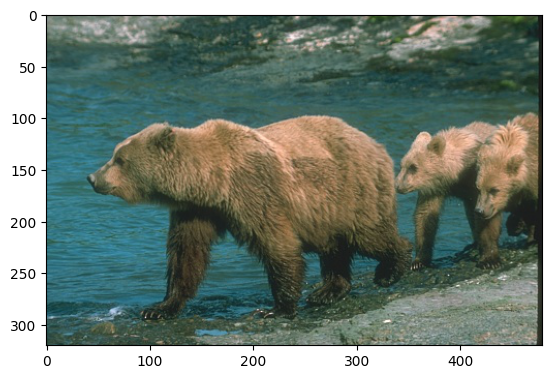

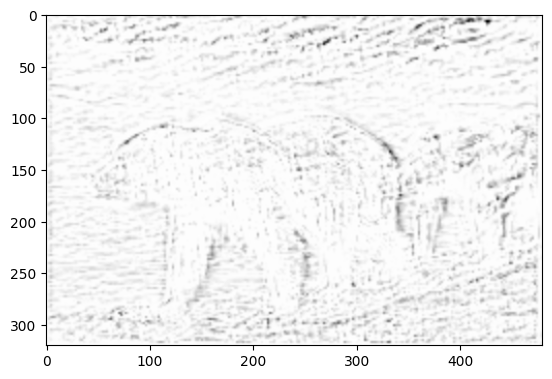

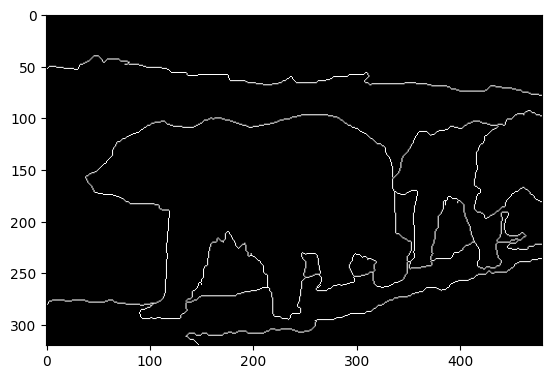

In [ ]:
import matplotlib.pyplot as plt

test_num = 0

output = seg_model(np.array([images[test_num]]))
plt.imshow(images[test_num])
plt.show()

plt.imshow(output[0][:,:,0], cmap='gray')
plt.show()

plt.imshow(annotations[test_num], cmap='gray')
plt.show()

Train network for two periods of different learning rates

In [ ]:
seg_model.compile(tf.optimizers.Adam(learning_rate=0.0003), loss = pixel_wise_bce)
seg_model.fit(images, annotations, batch_size = 1, epochs = 4)

seg_model.compile(tf.optimizers.Adam(learning_rate=0.00003), loss = pixel_wise_bce)
seg_model.fit(images, annotations, batch_size = 1, epochs = 6, validation_data=(val_images, val_annotations))

Epoch 1/4
200/200 [==============================] - 259s 590ms/step - loss: 0.0792
Epoch 2/4
200/200 [==============================] - 116s 578ms/step - loss: 0.0713
Epoch 3/4
200/200 [==============================] - 116s 581ms/step - loss: 0.0695
Epoch 4/4
200/200 [==============================] - 117s 587ms/step - loss: 0.0684
Epoch 1/6
200/200 [==============================] - 272s 847ms/step - loss: 0.0671 - val_loss: 0.0684
Epoch 2/6
200/200 [==============================] - 157s 785ms/step - loss: 0.0669 - val_loss: 0.0685
Epoch 3/6
200/200 [==============================] - 157s 787ms/step - loss: 0.0669 - val_loss: 0.0686
Epoch 4/6
200/200 [==============================] - 157s 785ms/step - loss: 0.0667 - val_loss: 0.0682
Epoch 5/6
200/200 [==============================] - 157s 786ms/step - loss: 0.0666 - val_loss: 0.0684
Epoch 6/6
200/200 [==============================] - 162s 812ms/step - loss: 0.0666 - val_loss: 0.0683


In [ ]:
seg_model.evaluate(test_images, test_annotations)

Save model

In [ ]:
seg_model.save('seg_model', save_format='tf')

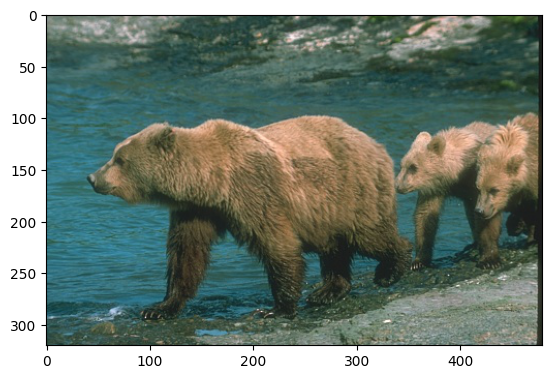

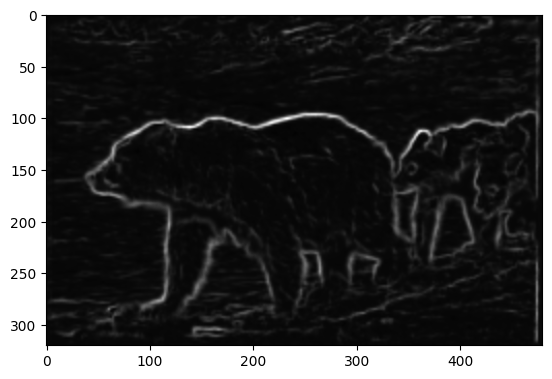

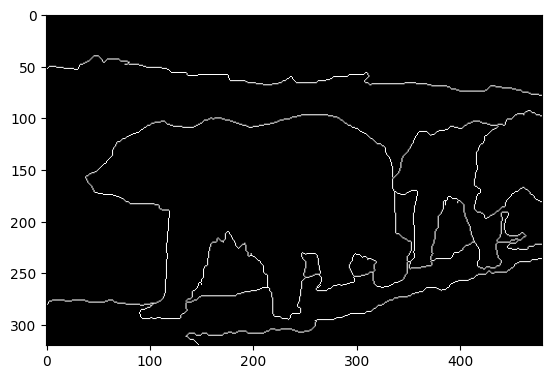

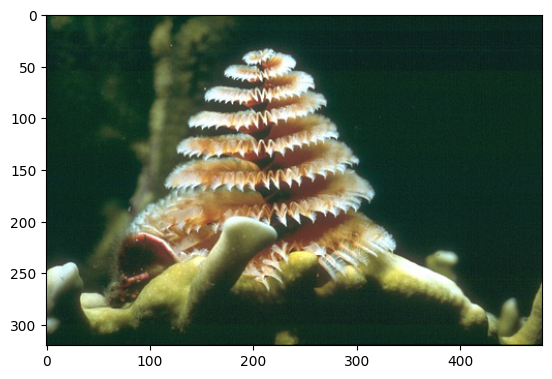

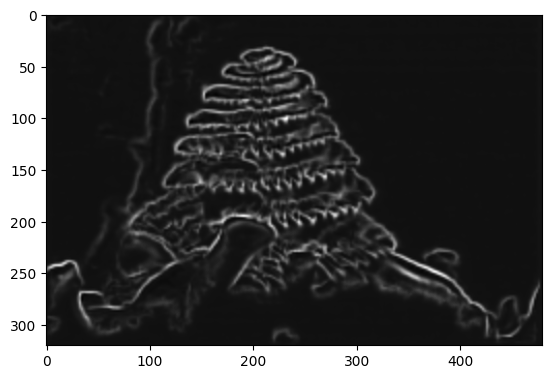

...

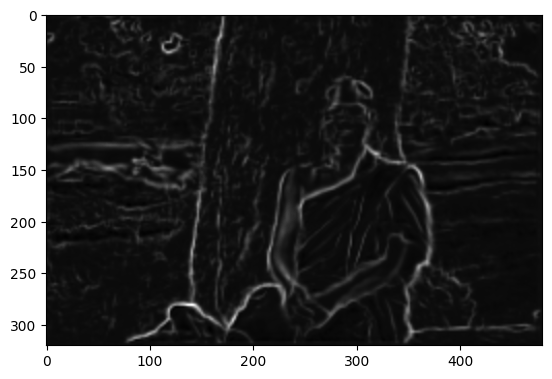

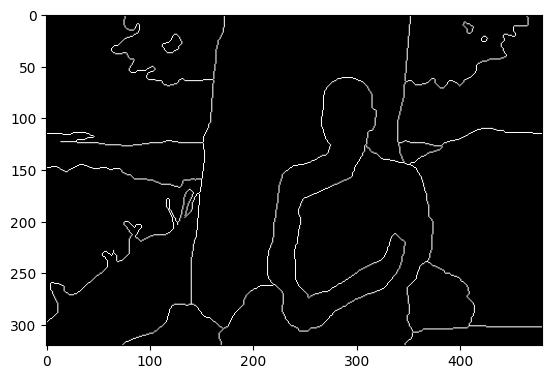

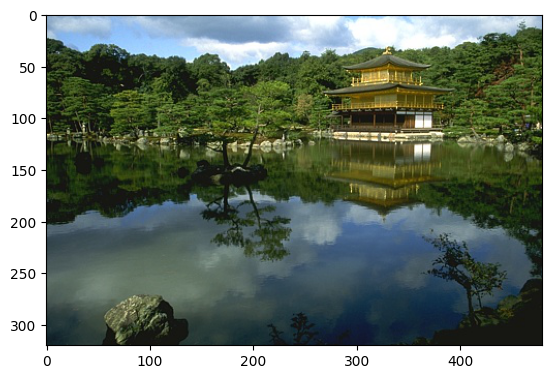

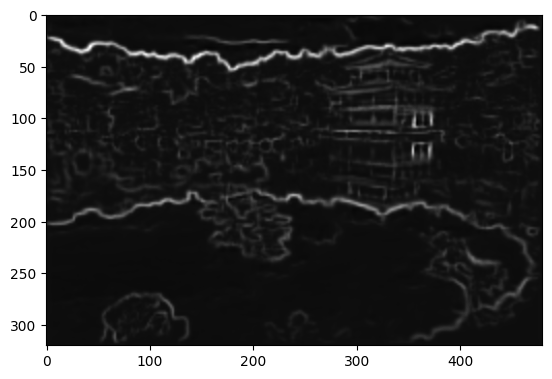

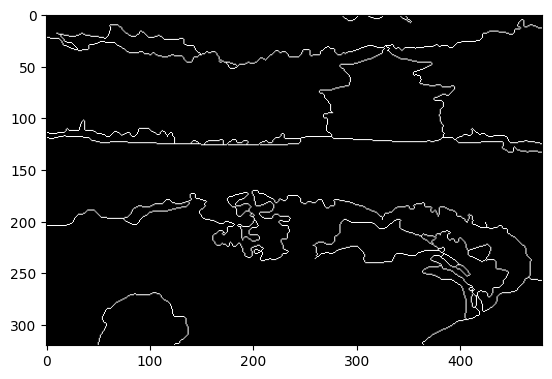

In [ ]:
# Generate salt and pepper noise
noise = np.zeros([320, 480, 3])
prob = 0.05  # Set the probability of a pixel being set to 0 or 255
noise[np.random.random(size=(320, 480, 3)) < prob] = 255
noise[np.random.random(size=(320, 480, 3)) < prob] = 0

for test_num in range(0, 200, 20):

    output = seg_model(np.array([images[test_num]]))
    plt.imshow(images[test_num])
    plt.show()

    plt.imshow(output[0][:,:,0], cmap='gray')
    plt.show()

    plt.imshow(annotations[test_num], cmap='gray')
    plt.show()

Test with smaller dataset

In [8]:
indices1 = np.random.choice(200, size=20, replace=False)
indices2 = np.random.choice(200, size=40, replace=False)
indices3 = np.random.choice(200, size=80, replace=False)
indices4 = np.random.choice(200, size=150, replace=False)

images1 = images[indices1]
images2 = images[indices2]
images3 = images[indices3]
images4 = images[indices4]

annotations1 = np.array(annotations)[indices1]
annotations2 = np.array(annotations)[indices2]
annotations3 = np.array(annotations)[indices3]
annotations4 = np.array(annotations)[indices4]

In [ ]:
seg_model1 = GammaNetBSDS(steps = 5)
seg_model1.build([1, 320, 480, 3])
output = seg_model1(np.array([images[0]]))

while pixel_wise_bce(annotations[0], output) > 0.195:
    print(pixel_wise_bce(annotations[0], output))
    seg_model1 = GammaNetBSDS(steps = 8)
    seg_model1.build([1, 320, 480, 3])
    output = seg_model1(np.array([images[0]]))
seg_model1.summary()

Model: "gamma_net_bsds"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 bu (fGRU)                   multiple                  16733     
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)

In [ ]:
output = seg_model1(np.array([images[0]]))
print(pixel_wise_bce(annotations[0], output))

tf.Tensor(0.19344689, shape=(), dtype=float32)


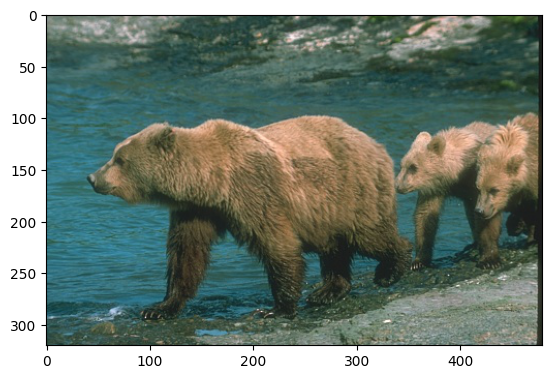

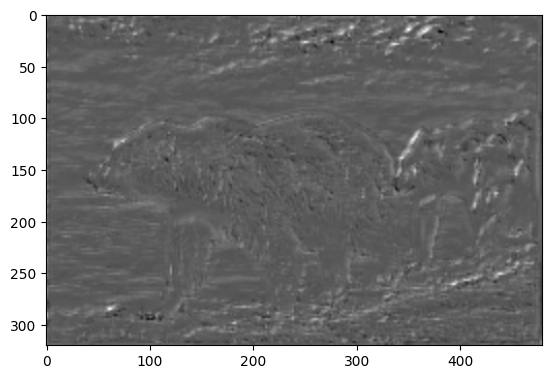

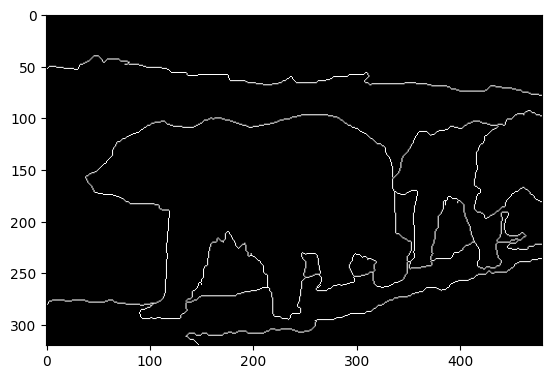

In [ ]:
import matplotlib.pyplot as plt

test_num = 0

output = seg_model1(np.array([images[test_num]]))
plt.imshow(images[test_num])
plt.show()

plt.imshow(output[0][:,:,0], cmap='gray')
plt.show()

plt.imshow(annotations[test_num], cmap='gray')
plt.show()

20 images

In [ ]:
seg_model1.compile(tf.optimizers.Adam(learning_rate=0.0003), loss = pixel_wise_bce)
seg_model1.fit(images1, annotations1, batch_size = 1, epochs = 10)

seg_model1.compile(tf.optimizers.Adam(learning_rate=0.00003), loss = pixel_wise_bce)
seg_model1.fit(images1, annotations1, batch_size = 1, epochs = 10, validation_data=(val_images, val_annotations))

Epoch 1/4
20/20 [==============================] - 89s 341ms/step - loss: 0.1061
Epoch 2/4
20/20 [==============================] - 7s 336ms/step - loss: 0.0889
Epoch 3/4
20/20 [==============================] - 7s 337ms/step - loss: 0.0855
Epoch 4/4
20/20 [==============================] - 7s 338ms/step - loss: 0.0827
Epoch 1/6
20/20 [==============================] - 120s 2s/step - loss: 0.0817 - val_loss: 0.0735
Epoch 2/6
20/20 [==============================] - 29s 1s/step - loss: 0.0812 - val_loss: 0.0732
Epoch 3/6
20/20 [==============================] - 21s 1s/step - loss: 0.0810 - val_loss: 0.0732
Epoch 4/6
20/20 [==============================] - 21s 1s/step - loss: 0.0808 - val_loss: 0.0730
Epoch 5/6
20/20 [==============================] - 27s 1s/step - loss: 0.0807 - val_loss: 0.0729
Epoch 6/6
20/20 [==============================] - 21s 1s/step - loss: 0.0805 - val_loss: 0.0729


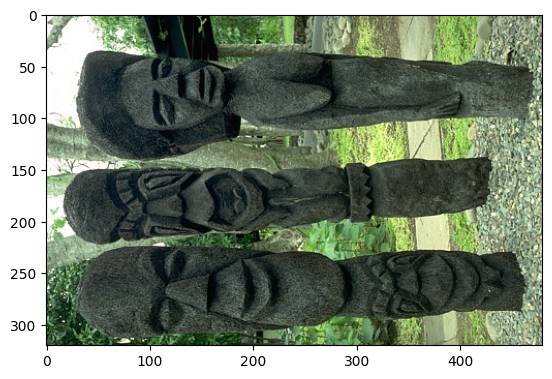

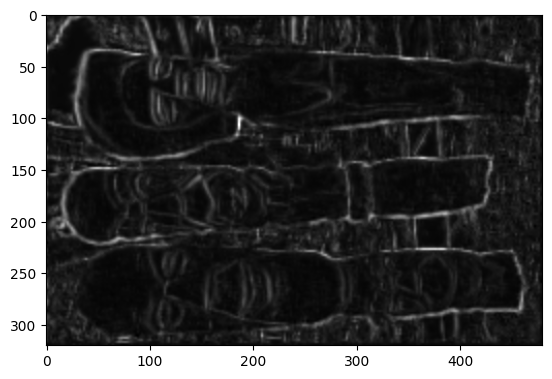

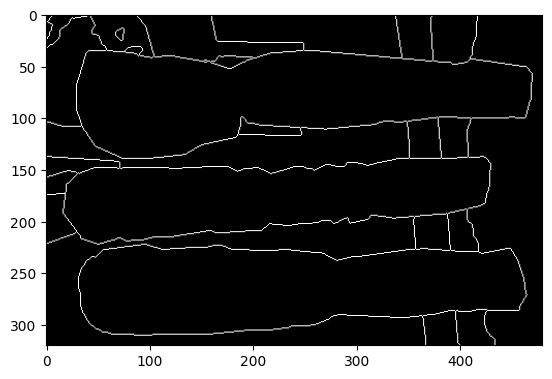

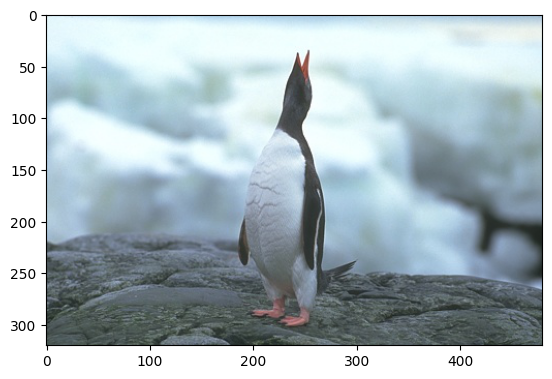

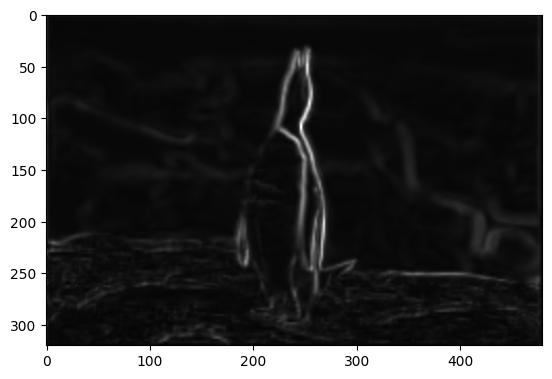

...

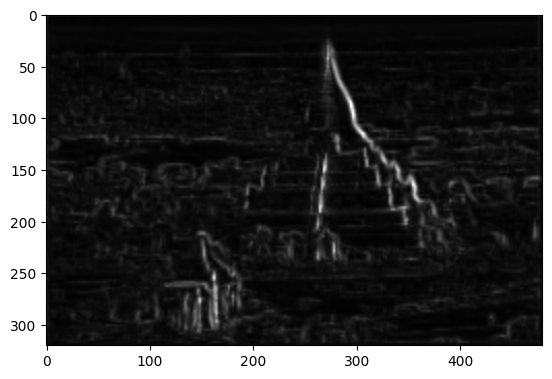

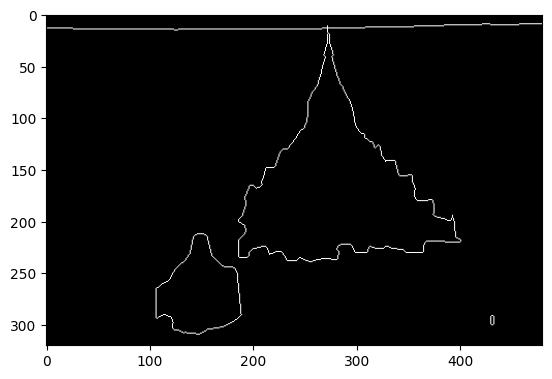

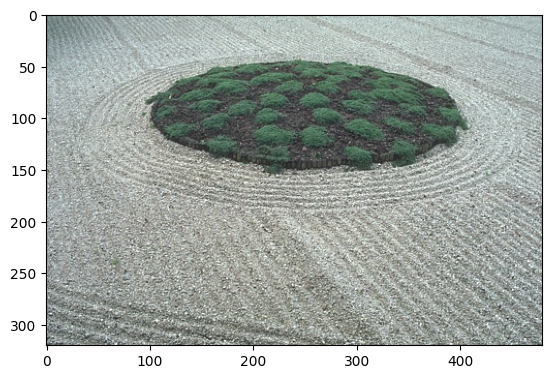

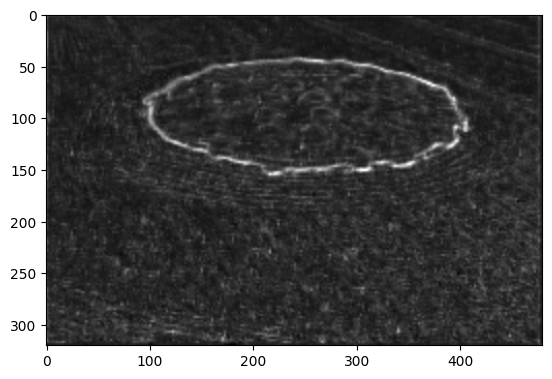

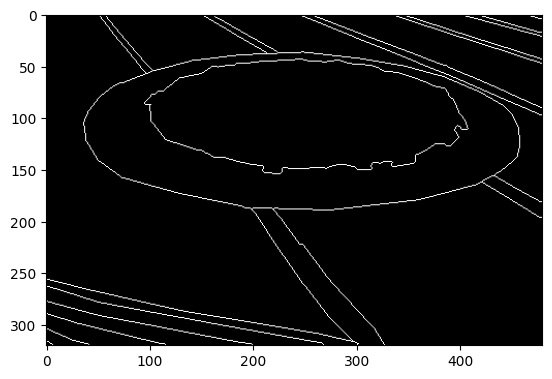

In [ ]:
for test_num in range(0, 100, 5):

    output = seg_model1(np.array([val_images[test_num]]))
    plt.imshow(val_images[test_num])
    plt.show()

    plt.imshow(output[0][:,:,0], cmap='gray')
    plt.show()

    plt.imshow(val_annotations[test_num], cmap='gray')
    plt.show()

40 images

In [19]:
seg_model2 = GammaNetBSDS(steps = 5)
seg_model2.build([1, 320, 480, 3])
output = seg_model2(np.array([images[0]]))

while pixel_wise_bce(annotations[0], output) > 0.195:
    print(pixel_wise_bce(annotations[0], output))
    seg_model2 = GammaNetBSDS(steps = 8)
    seg_model2.build([1, 320, 480, 3])
    output = seg_model2(np.array([images[0]]))
seg_model2.summary()

tf.Tensor(0.22552076, shape=(), dtype=float32)
tf.Tensor(0.21521561, shape=(), dtype=float32)
tf.Tensor(0.21452951, shape=(), dtype=float32)
tf.Tensor(0.21847005, shape=(), dtype=float32)
tf.Tensor(0.2395285, shape=(), dtype=float32)
tf.Tensor(0.20638548, shape=(), dtype=float32)
tf.Tensor(0.22003074, shape=(), dtype=float32)
tf.Tensor(0.22267172, shape=(), dtype=float32)
tf.Tensor(0.20017923, shape=(), dtype=float32)
Model: "gamma_net_bsds_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D) 

In [20]:
seg_model2.compile(tf.optimizers.Adam(learning_rate=0.0003), loss = pixel_wise_bce)
seg_model2.fit(images2, annotations2, batch_size = 1, epochs = 8)

seg_model2.compile(tf.optimizers.Adam(learning_rate=0.00003), loss = pixel_wise_bce)
seg_model2.fit(images2, annotations2, batch_size = 1, epochs = 10, validation_data=(val_images, val_annotations))

Epoch 1/8
40/40 [==============================] - 178s 538ms/step - loss: 0.1063
Epoch 2/8
40/40 [==============================] - 23s 575ms/step - loss: 0.0849
Epoch 3/8
40/40 [==============================] - 22s 558ms/step - loss: 0.0800
Epoch 4/8
40/40 [==============================] - 23s 567ms/step - loss: 0.0768
Epoch 5/8
40/40 [==============================] - 22s 556ms/step - loss: 0.0743
Epoch 6/8
40/40 [==============================] - 23s 563ms/step - loss: 0.0731
Epoch 7/8
40/40 [==============================] - 23s 579ms/step - loss: 0.0723
Epoch 8/8
40/40 [==============================] - 23s 568ms/step - loss: 0.0801
Epoch 1/10
40/40 [==============================] - 180s 2s/step - loss: 0.0734 - val_loss: 0.0709
Epoch 2/10
40/40 [==============================] - 63s 2s/step - loss: 0.0712 - val_loss: 0.0707
Epoch 3/10
40/40 [==============================] - 45s 1s/step - loss: 0.0707 - val_loss: 0.0708
Epoch 4/10
40/40 [==============================] - 63s 

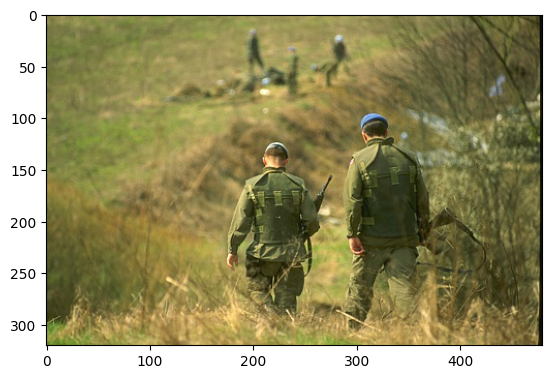

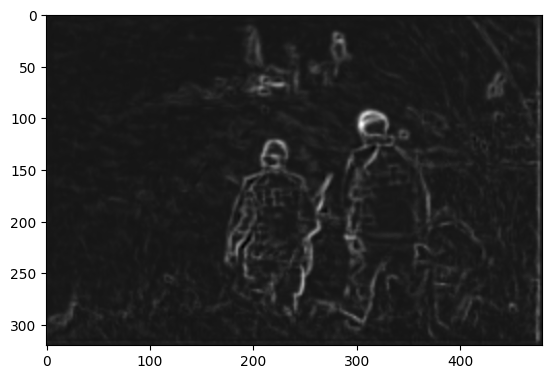

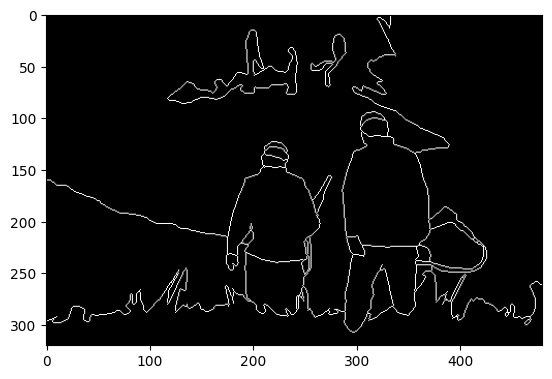

In [24]:
test_num = 30

output = seg_model2(np.array([val_images[test_num]]))
plt.imshow(val_images[test_num])
plt.show()

plt.imshow(output[0][:,:,0], cmap='gray')
plt.show()

plt.imshow(val_annotations[test_num], cmap='gray')
plt.show()

80 images

In [16]:
seg_model3 = GammaNetBSDS(steps = 5)
seg_model3.build([1, 320, 480, 3])
output = seg_model3(np.array([images[0]]))

while pixel_wise_bce(annotations[0], output) > 0.195:
    seg_model3 = GammaNetBSDS(steps = 8)
    seg_model3.build([1, 320, 480, 3])
    output = seg_model3(np.array([images[0]]))
    print(pixel_wise_bce(annotations[0], output))
seg_model3.summary()

tf.Tensor(0.2275725, shape=(), dtype=float32)
tf.Tensor(0.25335953, shape=(), dtype=float32)
tf.Tensor(0.20406945, shape=(), dtype=float32)
tf.Tensor(0.22145455, shape=(), dtype=float32)
tf.Tensor(0.20222811, shape=(), dtype=float32)
tf.Tensor(0.20178108, shape=(), dtype=float32)
tf.Tensor(0.22947149, shape=(), dtype=float32)
tf.Tensor(0.2053219, shape=(), dtype=float32)
tf.Tensor(0.22322226, shape=(), dtype=float32)
tf.Tensor(0.226154, shape=(), dtype=float32)
tf.Tensor(0.22171956, shape=(), dtype=float32)
tf.Tensor(0.2543082, shape=(), dtype=float32)
tf.Tensor(0.20749766, shape=(), dtype=float32)
tf.Tensor(0.25107723, shape=(), dtype=float32)
tf.Tensor(0.24384053, shape=(), dtype=float32)
tf.Tensor(0.24353012, shape=(), dtype=float32)
tf.Tensor(0.2161687, shape=(), dtype=float32)
tf.Tensor(0.23451696, shape=(), dtype=float32)
tf.Tensor(0.18490387, shape=(), dtype=float32)
Model: "gamma_net_bsds_56"
_________________________________________________________________
 Layer (type)       

In [17]:
seg_model3.compile(tf.optimizers.Adam(learning_rate=0.0003), loss = pixel_wise_bce)
seg_model3.fit(images3, annotations3, batch_size = 1, epochs = 2)

seg_model3.compile(tf.optimizers.Adam(learning_rate=0.00003), loss = pixel_wise_bce)
seg_model3.fit(images3, annotations3, batch_size = 1, epochs = 5, validation_data=(val_images, val_annotations))

Epoch 1/2
80/80 [==============================] - 146s 582ms/step - loss: 0.0872
Epoch 2/2
80/80 [==============================] - 46s 573ms/step - loss: 0.0778
Epoch 1/5
80/80 [==============================] - 207s 1s/step - loss: 0.0776 - val_loss: 0.0723
Epoch 2/5
80/80 [==============================] - 88s 1s/step - loss: 0.0724 - val_loss: 0.0717
Epoch 3/5
80/80 [==============================] - 88s 1s/step - loss: 0.0718 - val_loss: 0.0714
Epoch 4/5
80/80 [==============================] - 88s 1s/step - loss: 0.0714 - val_loss: 0.0711
Epoch 5/5
80/80 [==============================] - 70s 873ms/step - loss: 0.0714 - val_loss: 0.0713


In [19]:
seg_model3.fit(images3, annotations3, batch_size = 1, epochs = 5, validation_data=(val_images, val_annotations))

Epoch 1/5
80/80 [==============================] - 88s 1s/step - loss: 0.0709 - val_loss: 0.0707
Epoch 2/5
80/80 [==============================] - 88s 1s/step - loss: 0.0706 - val_loss: 0.0710
Epoch 3/5
80/80 [==============================] - 70s 873ms/step - loss: 0.0708 - val_loss: 0.0705
Epoch 4/5
80/80 [==============================] - 69s 869ms/step - loss: 0.0705 - val_loss: 0.0706
Epoch 5/5
80/80 [==============================] - 87s 1s/step - loss: 0.0702 - val_loss: 0.0707


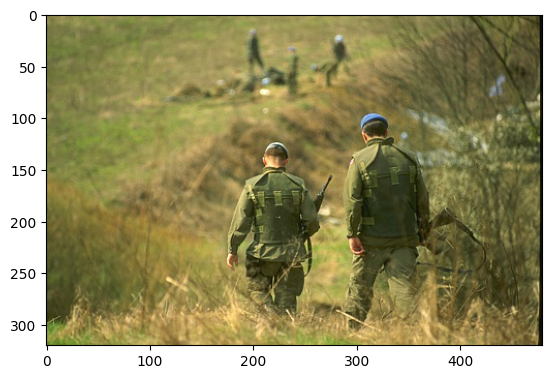

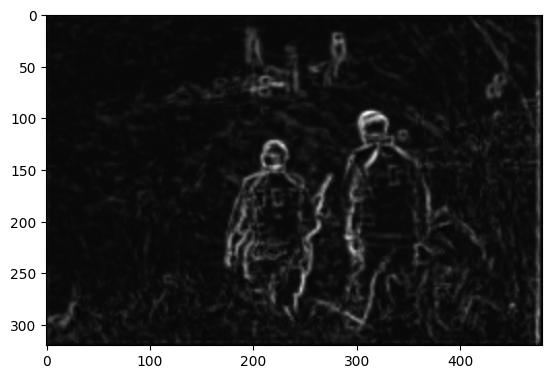

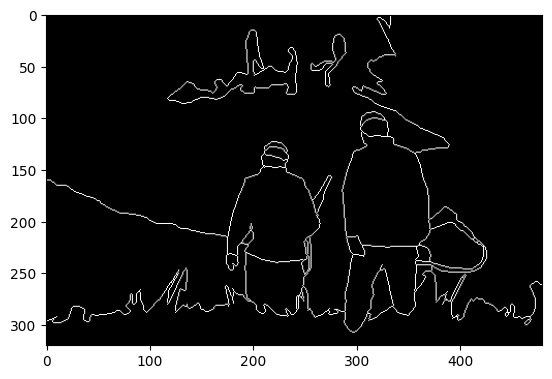

In [20]:
test_num = 30

output = seg_model3(np.array([val_images[test_num]]))
plt.imshow(val_images[test_num])
plt.show()

plt.imshow(output[0][:,:,0], cmap='gray')
plt.show()

plt.imshow(val_annotations[test_num], cmap='gray')
plt.show()

150 images

In [9]:
seg_model4 = GammaNetBSDS(steps = 5)
seg_model4.build([1, 320, 480, 3])
output = seg_model4(np.array([images[0]]))

while pixel_wise_bce(annotations[0], output) > 0.195:
    print(pixel_wise_bce(annotations[0], output))
    seg_model4 = GammaNetBSDS(steps = 8)
    seg_model4.build([1, 320, 480, 3])
    output = seg_model4(np.array([images[0]]))
seg_model4.summary()

tf.Tensor(0.22443192, shape=(), dtype=float32)
tf.Tensor(0.21405421, shape=(), dtype=float32)
tf.Tensor(0.21391301, shape=(), dtype=float32)
tf.Tensor(0.219634, shape=(), dtype=float32)
tf.Tensor(0.23235656, shape=(), dtype=float32)
tf.Tensor(0.24181046, shape=(), dtype=float32)
Model: "gamma_net_bsds_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None

In [10]:
seg_model4.compile(tf.optimizers.Adam(learning_rate=0.0003), loss = pixel_wise_bce)
seg_model4.fit(images4, annotations4, batch_size = 1, epochs = 4)

seg_model4.compile(tf.optimizers.Adam(learning_rate=0.00003), loss = pixel_wise_bce)
seg_model4.fit(images4, annotations4, batch_size = 1, epochs = 6, validation_data=(val_images, val_annotations))

Epoch 1/4
150/150 [==============================] - 197s 585ms/step - loss: 0.0790
Epoch 2/4
150/150 [==============================] - 88s 584ms/step - loss: 0.0711
Epoch 3/4
150/150 [==============================] - 88s 584ms/step - loss: 0.0713
Epoch 4/4
150/150 [==============================] - 88s 584ms/step - loss: 0.0696
Epoch 1/6
150/150 [==============================] - 239s 937ms/step - loss: 0.0682 - val_loss: 0.0696
Epoch 2/6
150/150 [==============================] - 129s 861ms/step - loss: 0.0679 - val_loss: 0.0699
Epoch 3/6
150/150 [==============================] - 129s 861ms/step - loss: 0.0678 - val_loss: 0.0693
Epoch 4/6
150/150 [==============================] - 129s 861ms/step - loss: 0.0677 - val_loss: 0.0690
Epoch 5/6
150/150 [==============================] - 129s 861ms/step - loss: 0.0676 - val_loss: 0.0689
Epoch 6/6
150/150 [==============================] - 129s 861ms/step - loss: 0.0676 - val_loss: 0.0692


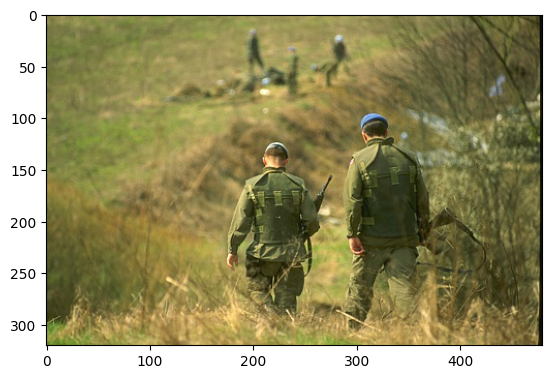

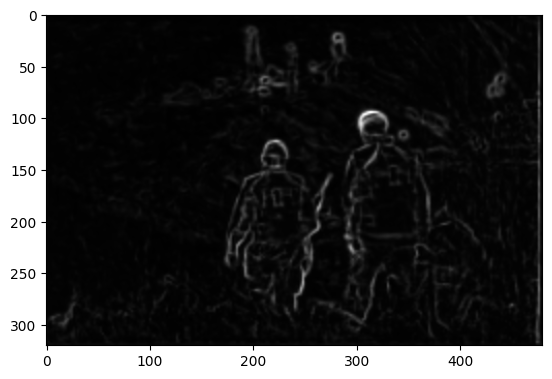

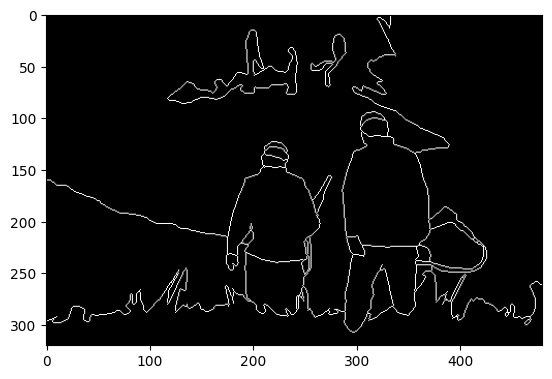

In [11]:
test_num = 30

output = seg_model4(np.array([val_images[test_num]]))
plt.imshow(val_images[test_num])
plt.show()

plt.imshow(output[0][:,:,0], cmap='gray')
plt.show()

plt.imshow(val_annotations[test_num], cmap='gray')
plt.show()